In [1]:
from tensorflow.keras.models import load_model
import tensorflow as tf
import os
import tensorflow_hub as hub
import tensorflow_addons as tfa
import numpy as np
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import os
import time
from matplotlib import pyplot as plt
import cv2
import string
import unicodedata

C:\Users\ohits\anaconda3\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
new_model = load_model('models/solar_field_classifier.h5')
data_aug_model = load_model('models/solar_field_classifier_data_aug.h5')

In [3]:
#Load Data

df = pd.read_excel('Global Solar Power Tracker - main V1.xlsx', 'Europe')
df = df.loc[(df['Location accuracy']=='exact') & (df['Technology Type'] != 'Solar Thermal')&(df['Status']=='operating')]
df = df[['Country', 'Project Name', 'Capacity (MW)', 'Latitude', 'Longitude']].reset_index(drop=True)
df['Capacity (MW)'] = pd.to_numeric(df['Capacity (MW)'])
df = df.loc[df['Capacity (MW)']>5].reset_index(drop=True)



In [6]:
imagess = 'ImageFetching_2023-05-31_1417.xlsx'
previmages_df = pd.read_excel(imagess, index_col=0)
used_index = previmages_df.index.tolist()

used_df = df.index.isin(used_index)
unused_europe = df[~used_df].reset_index(drop=True)

In [7]:
unused_europe

,Country,Project Name,Capacity (MW),Latitude,Longitude
0,Germany,LHI Solar Deutschland V GmbH & Co. KG II solar...,7.0,53.5508,12.5691
1,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,5.6,51.5910,14.1392
2,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,9.8,51.5910,14.1392
3,Germany,LHI Solar Prenzlau GmbH & Co. KG solar farm,13.0,53.3172,13.8817
4,Germany,LHI SolarWind Euerwang GmbH & Co. KG (Erweiter...,5.9,49.0090,11.3445
...,...,...,...,...,...
737,United Kingdom,Wroughton Airfield Solar Park,61.0,51.5104,-1.8124
738,United Kingdom,Wymeswold Airfield solar farm,34.0,52.8033,-1.1116
739,United Kingdom,Yarburgh Grove Farm solar farm,8.1,53.4075,0.0188
740,United Kingdom,Yerbeston Gate Farm solar farm,6.1,51.7473,-4.7945


In [5]:
for i,country, projname, cap, lat, lon in unused_europe:
    api_key = 'AmsQbXtxrmBgb0YK_x1LDIGMdCtq9YgTLfiKn76-I-QU2yGZneThmpzh4MTHT32x'
    zoom_level = 18
    map_width = 600
    map_height = 600

    lat = unused_europe.loc[244]['Latitude']
    lon = unused_europe.loc[244]['Longitude']

    api_url = f'https://dev.virtualearth.net/REST/v1/Imagery/Map/Aerial/{lat},{lon}/{zoom_level}?mapsize={map_width},{map_height}&key={api_key}'

    response = requests.get(api_url)

    image = Image.open(BytesIO(response.content))

ValueError: too many values to unpack (expected 6)

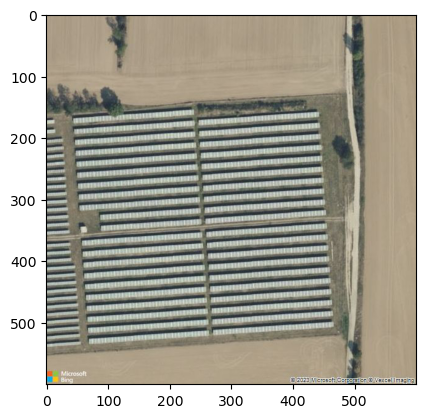

In [17]:
plt.imshow(image)
plt.show()

In [8]:
def execute_model(img):
    #make our image something the model can read
    resized = tf.image.resize(img, (256, 256))
    scaled = resized/255
    #this is to get our image into the format (batch size, 256, 256, 3) where batch size is 1
    #right now our image is in the format (256, 256, 3)
    as_batch = np.expand_dims(scaled, 0)
    
    #execute the model
    yhat = new_model.predict(as_batch)
    
    return yhat

In [9]:
def execute_dataaug_model(img):
    #make our image something the model can read
    resized = tf.image.resize(img, (256, 256))
    scaled = resized/255
    #this is to get our image into the format (batch size, 256, 256, 3) where batch size is 1
    #right now our image is in the format (256, 256, 3)
    as_batch = np.expand_dims(scaled, 0)
    
    #execute the model
    yhat = data_aug_model.predict(as_batch)
    
    return yhat

1/1 [==============================] - 0s 42ms/step


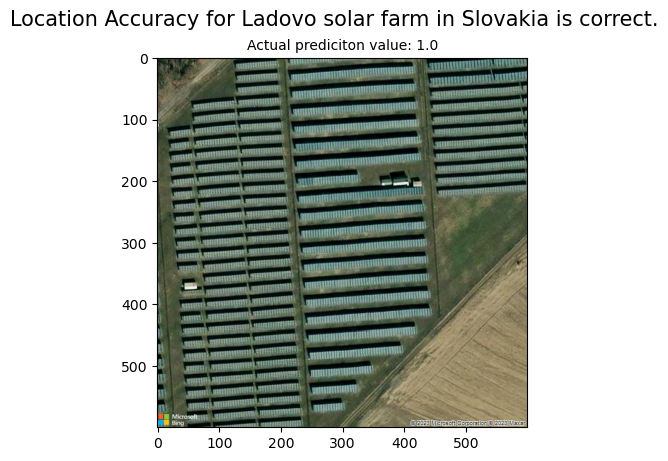

1/1 [==============================] - 0s 60ms/step


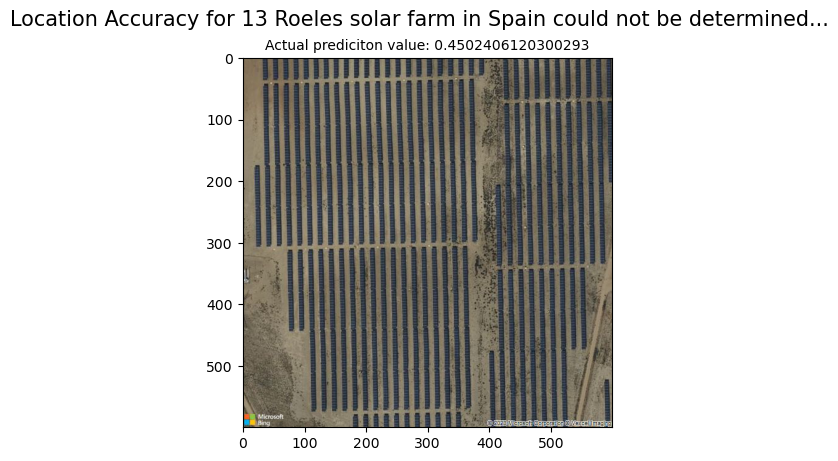

1/1 [==============================] - 0s 71ms/step


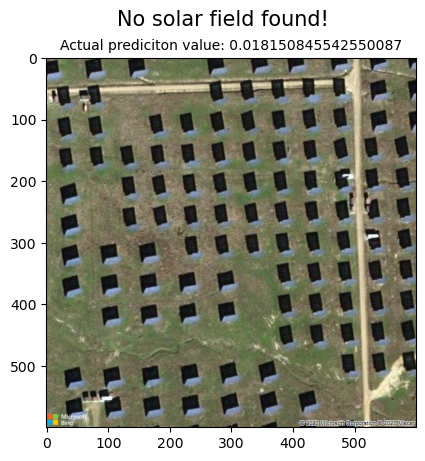

1/1 [==============================] - 0s 50ms/step


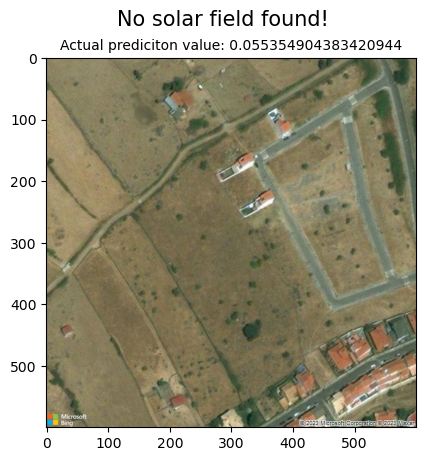

1/1 [==============================] - 0s 65ms/step


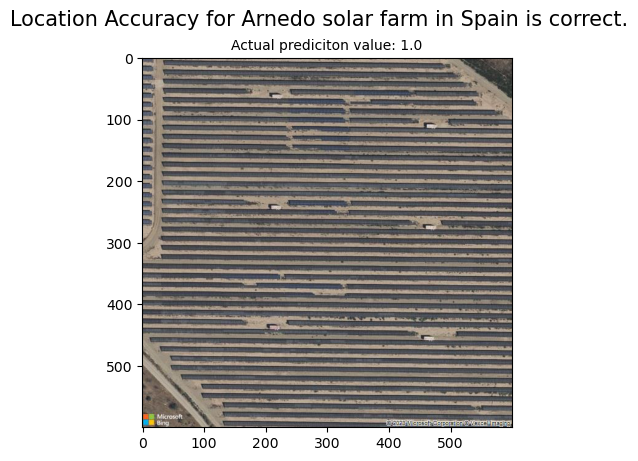

1/1 [==============================] - 0s 60ms/step


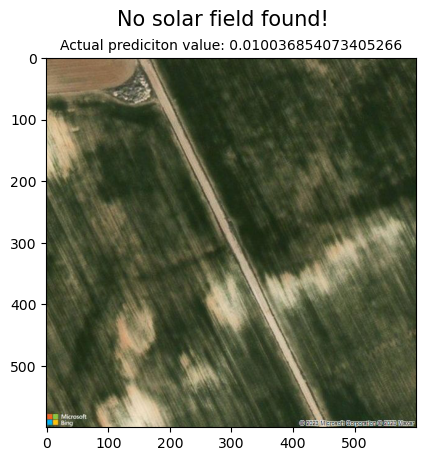

1/1 [==============================] - 0s 83ms/step


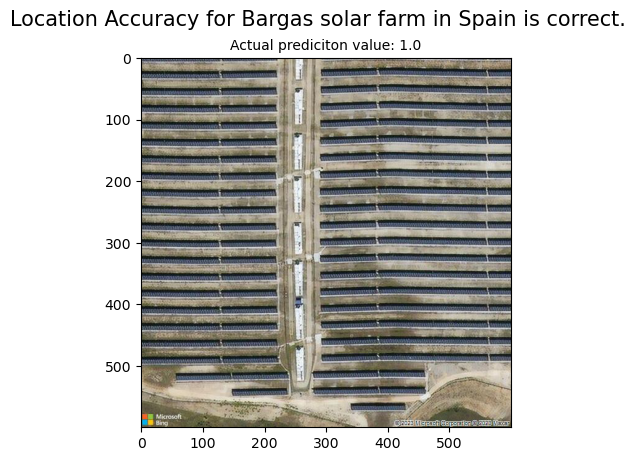

1/1 [==============================] - 0s 43ms/step


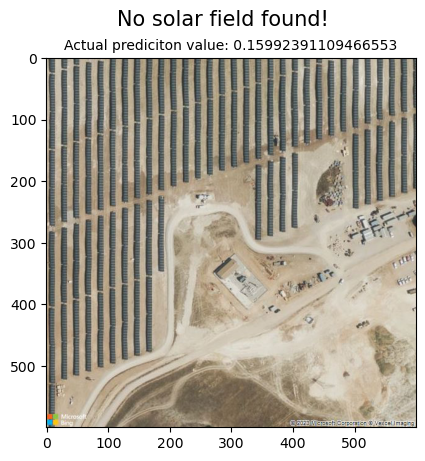

1/1 [==============================] - 0s 60ms/step


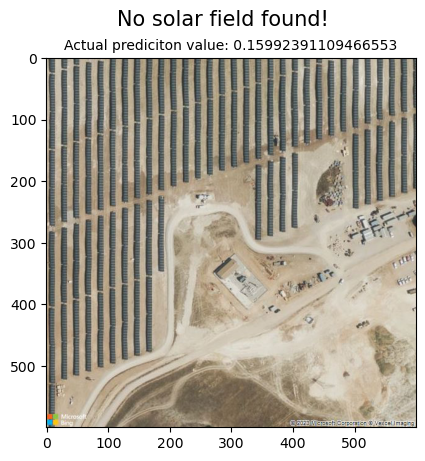

1/1 [==============================] - 0s 62ms/step


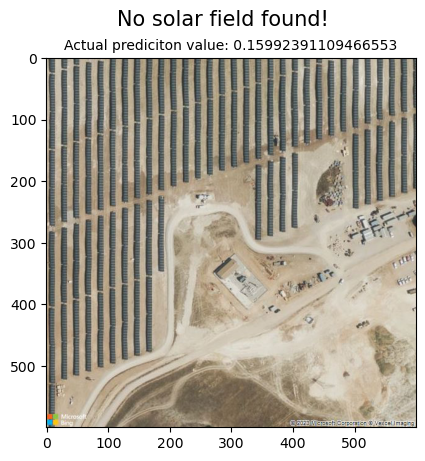

1/1 [==============================] - 0s 49ms/step


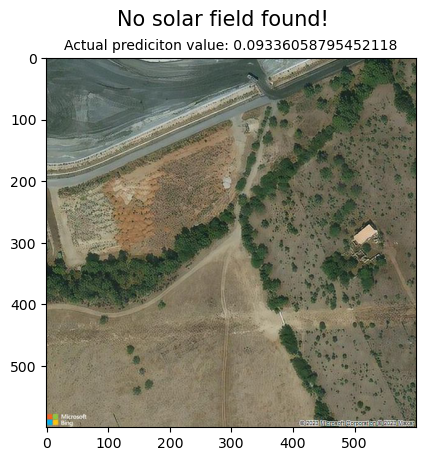

1/1 [==============================] - 0s 62ms/step


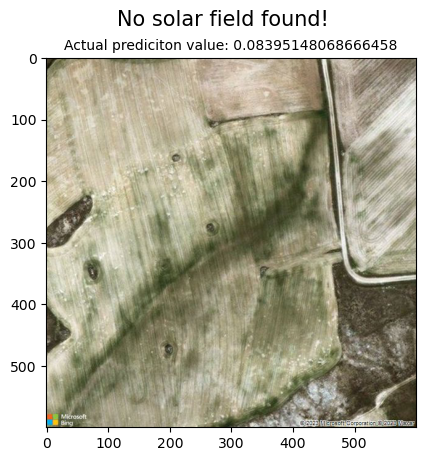

1/1 [==============================] - 0s 30ms/step


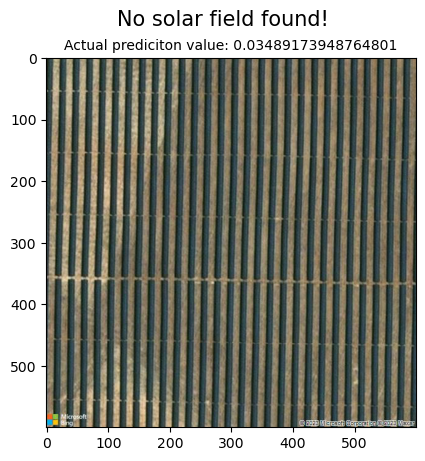

1/1 [==============================] - 0s 39ms/step


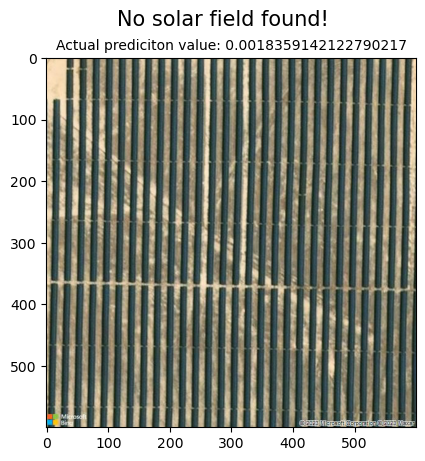

1/1 [==============================] - 0s 30ms/step


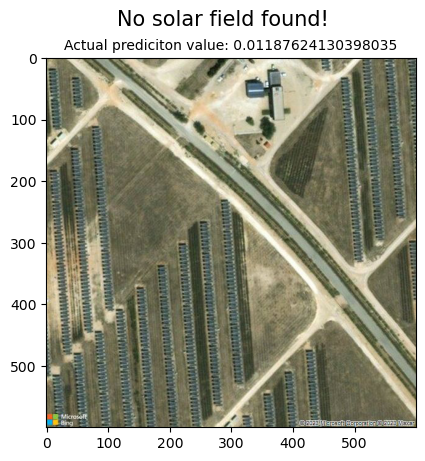

1/1 [==============================] - 0s 51ms/step


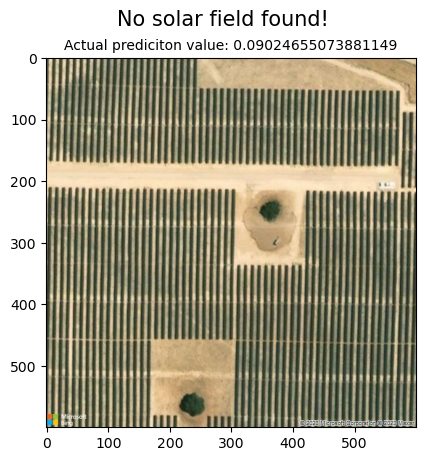

1/1 [==============================] - 0s 30ms/step


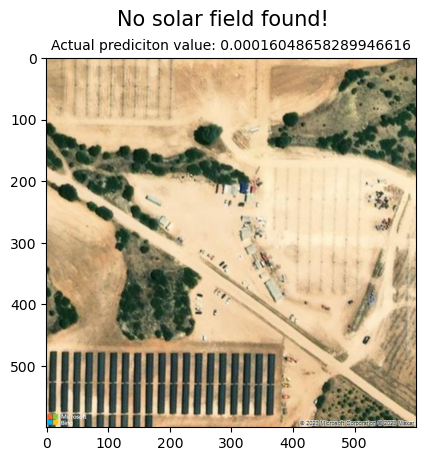

1/1 [==============================] - 0s 29ms/step


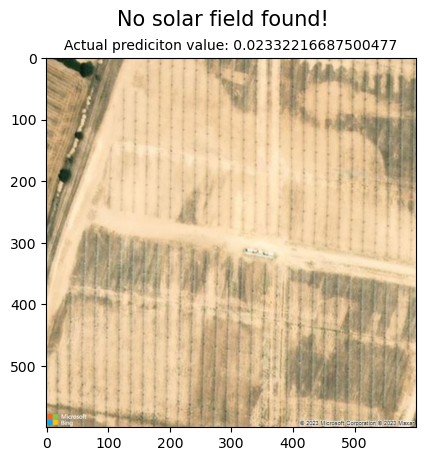

1/1 [==============================] - 0s 62ms/step


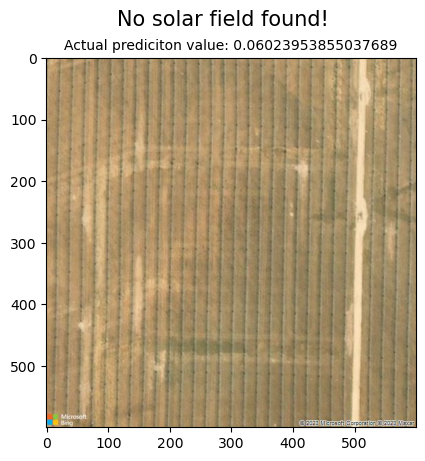

1/1 [==============================] - 0s 41ms/step


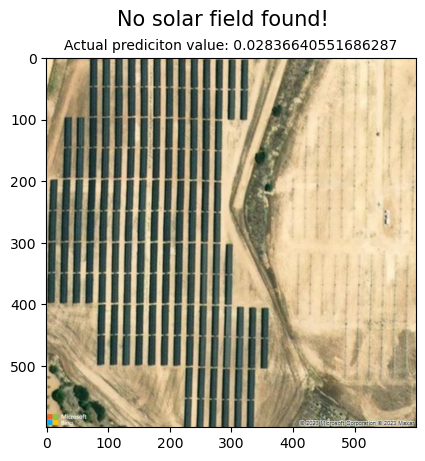

1/1 [==============================] - 0s 66ms/step


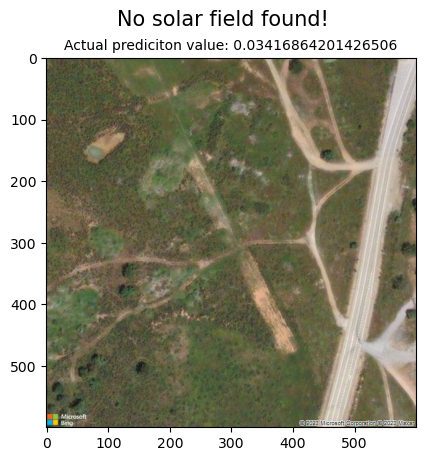

1/1 [==============================] - 0s 40ms/step


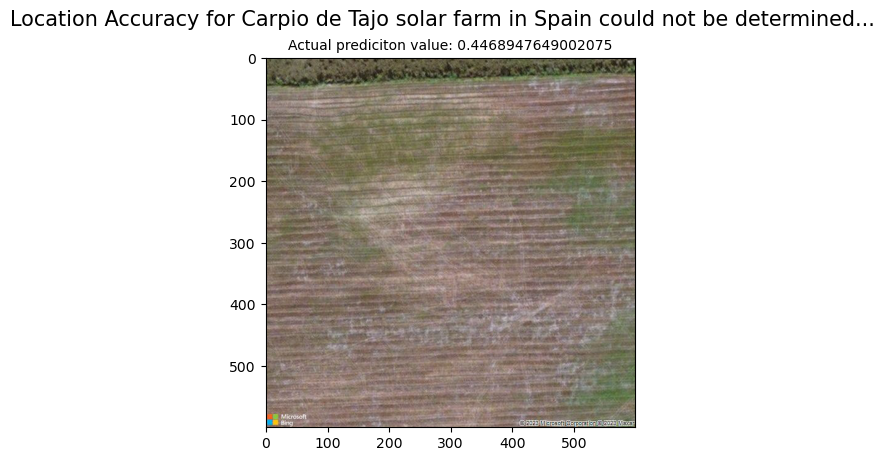

1/1 [==============================] - 0s 45ms/step


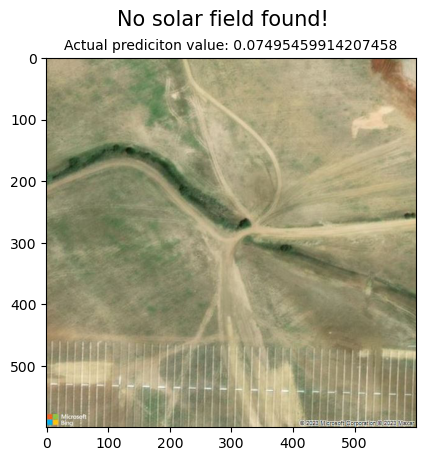

1/1 [==============================] - 0s 41ms/step


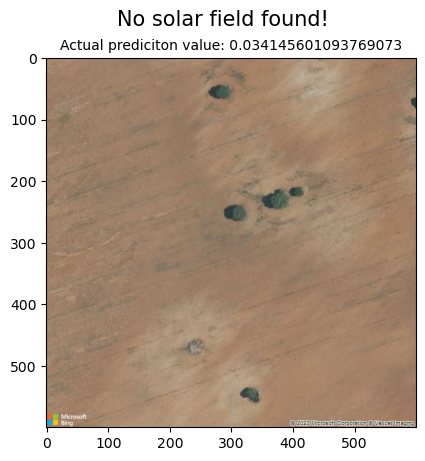

1/1 [==============================] - 0s 60ms/step


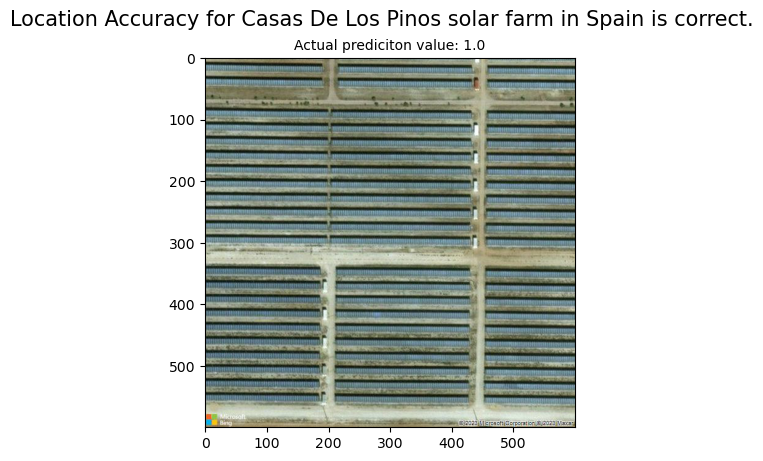

1/1 [==============================] - 0s 50ms/step


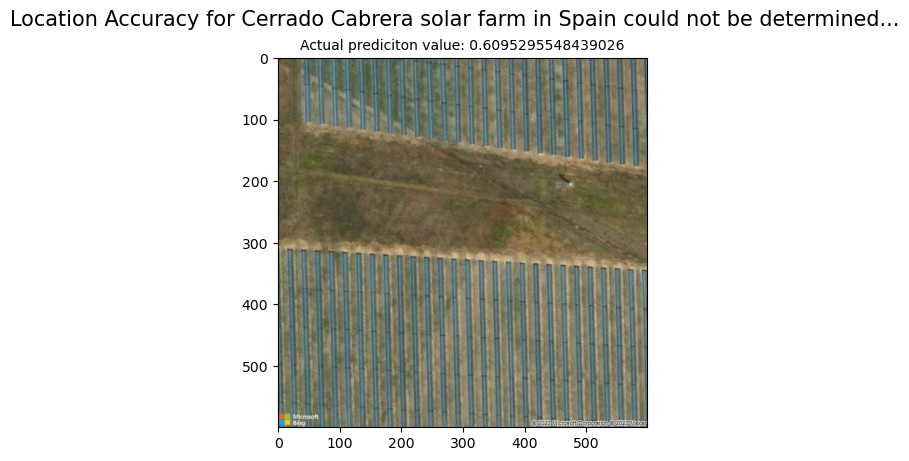

1/1 [==============================] - 0s 56ms/step


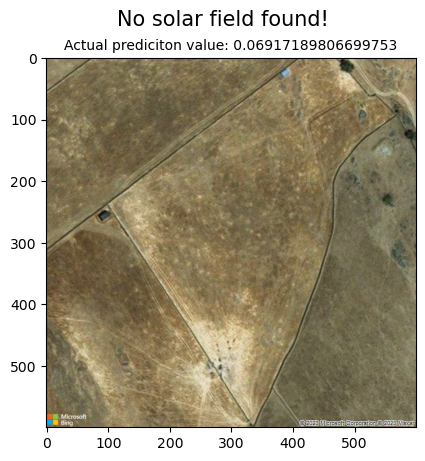

1/1 [==============================] - 0s 81ms/step


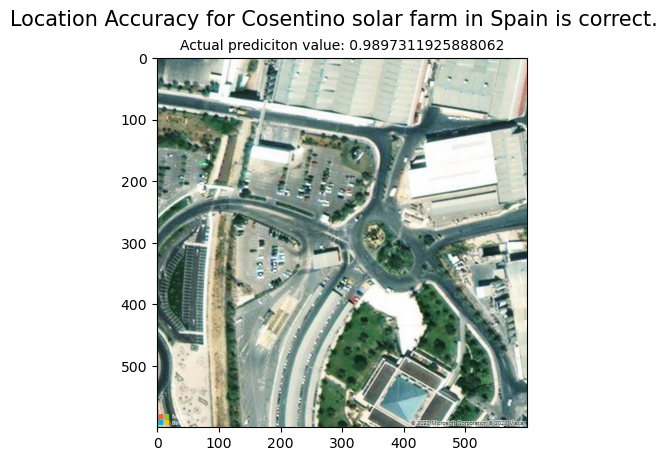

1/1 [==============================] - 0s 50ms/step


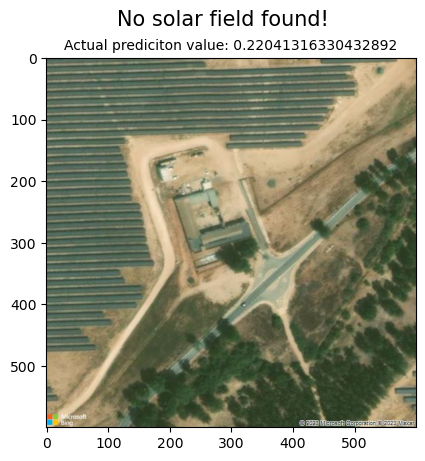

1/1 [==============================] - 0s 70ms/step


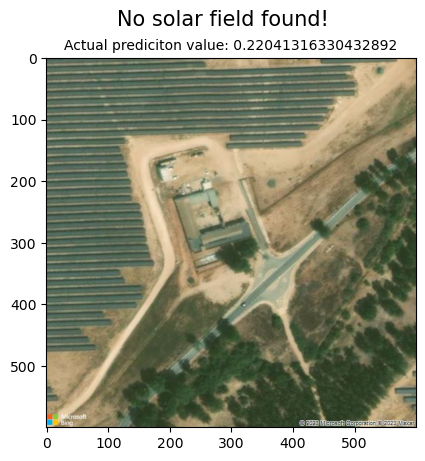

In [18]:
for i,country, projname, cap, lat, lon in unused_europe[105:135].reset_index().values:
    api_key = 'AmsQbXtxrmBgb0YK_x1LDIGMdCtq9YgTLfiKn76-I-QU2yGZneThmpzh4MTHT32x'
    zoom_level = 18
    map_width = 600
    map_height = 600

    api_url = f'https://dev.virtualearth.net/REST/v1/Imagery/Map/Aerial/{lat},{lon}/{zoom_level}?mapsize={map_width},{map_height}&key={api_key}'

    response = requests.get(api_url)

    image = Image.open(BytesIO(response.content))
    prediction = execute_model(image)
    
     
    if prediction > 0.7:
        #print(f'Location Accuracy for {projname} in {country} is correct. | Actual prediciton value: {prediction[0][0]}')
        plt.imshow(image)
        plt.suptitle(f'Location Accuracy for {projname} in {country} is correct.', fontsize=15)
        plt.title(f'Actual prediciton value: {prediction[0][0]}', fontsize=10)
        plt.show()
    elif prediction < 0.3:
        #print(f'Location Accuracy for {projname} in {country} is incorrect! No solar field found! | Actual prediciton value: {prediction[0][0]}')
        plt.imshow(image)
        plt.suptitle(f'No solar field found!', fontsize=15)
        plt.title(f'Actual prediciton value: {prediction[0][0]}', fontsize=10)
        plt.show()
    else:
        #print(f'Location Accuracy for {projname} in {country} could not be determined... | Actual prediciton value: {prediction[0][0]}')
        plt.imshow(image)
        plt.suptitle(f'Location Accuracy for {projname} in {country} could not be determined...', fontsize=15)
        plt.title(f'Actual prediciton value: {prediction[0][0]}', fontsize=10)
        plt.show()        

In [12]:
results = []
for i,country, projname, cap, lat, lon in unused_europe.reset_index().values:
    api_key = 'AmsQbXtxrmBgb0YK_x1LDIGMdCtq9YgTLfiKn76-I-QU2yGZneThmpzh4MTHT32x'
    zoom_level = 18
    map_width = 600
    map_height = 600

    api_url = f'https://dev.virtualearth.net/REST/v1/Imagery/Map/Aerial/{lat},{lon}/{zoom_level}?mapsize={map_width},{map_height}&key={api_key}'

    response = requests.get(api_url)

    image = Image.open(BytesIO(response.content))
    prediction = execute_model(image)
    
     
    if prediction > 0.7:
        result = 'CORRECT'
        results.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} is correct. | Actual prediciton value: {prediction[0][0]}')

    elif prediction < 0.3:
        result = 'INCORRECT'
        results.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} is incorrect! No solar field found! | Actual prediciton value: {prediction[0][0]}')

    else:
        result = 'UNCERTAIN'
        results.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} could not be determined... | Actual prediciton value: {prediction[0][0]}')


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 68ms/step


1/1 [==============================] - 0s 44ms/step


In [62]:
results2 = []
for i,country, projname, cap, lat, lon in unused_europe.reset_index().values:
    api_key = 'AmsQbXtxrmBgb0YK_x1LDIGMdCtq9YgTLfiKn76-I-QU2yGZneThmpzh4MTHT32x'
    zoom_level = 18
    map_width = 600
    map_height = 600

    api_url = f'https://dev.virtualearth.net/REST/v1/Imagery/Map/Aerial/{lat},{lon}/{zoom_level}?mapsize={map_width},{map_height}&key={api_key}'

    response = requests.get(api_url)

    image = Image.open(BytesIO(response.content))
    prediction = execute_dataaug_model(image)
    
     
    if prediction > 0.7:
        result = 'CORRECT'
        results2.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} is correct. | Actual prediciton value: {prediction[0][0]}')

    elif prediction < 0.3:
        result = 'INCORRECT'
        results2.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} is incorrect! No solar field found! | Actual prediciton value: {prediction[0][0]}')

    else:
        result = 'UNCERTAIN'
        results2.append([i, country, projname, cap, lat, lon, result, prediction, image])
        #print(f'Location Accuracy for {projname} in {country} could not be determined... | Actual prediciton value: {prediction[0][0]}')


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 16ms/step


In [14]:
results1_df = pd.DataFrame(results, columns=['Index', 'Country', 'Project Name', 'Capacity', 'Latitude', 'Longitude', 'Location Accuracy Assessment', 'Prediction Value', 'Image Data'])
results1_df

,Index,Country,Project Name,Capacity,Latitude,Longitude,Location Accuracy Assessment,Prediction Value,Image Data
0,0,Germany,LHI Solar Deutschland V GmbH & Co. KG II solar...,7.0,53.5508,12.5691,CORRECT,[[0.99999976]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,1,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,5.6,51.5910,14.1392,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,2,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,9.8,51.5910,14.1392,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,3,Germany,LHI Solar Prenzlau GmbH & Co. KG solar farm,13.0,53.3172,13.8817,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,4,Germany,LHI SolarWind Euerwang GmbH & Co. KG (Erweiter...,5.9,49.0090,11.3445,INCORRECT,[[0.015827628]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...,...
737,737,United Kingdom,Wroughton Airfield Solar Park,61.0,51.5104,-1.8124,INCORRECT,[[0.09255331]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
738,738,United Kingdom,Wymeswold Airfield solar farm,34.0,52.8033,-1.1116,INCORRECT,[[0.067518525]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
739,739,United Kingdom,Yarburgh Grove Farm solar farm,8.1,53.4075,0.0188,INCORRECT,[[0.05518969]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
740,740,United Kingdom,Yerbeston Gate Farm solar farm,6.1,51.7473,-4.7945,INCORRECT,[[0.29968983]],<PIL.JpegImagePlugin.JpegImageFile image mode=...


In [63]:
results2_df = pd.DataFrame(results2, columns=['Index', 'Country', 'Project Name', 'Capacity', 'Latitude', 'Longitude', 'Location Accuracy Assessment', 'Prediction Value', 'Image Data'])
results2_df

,Index,Country,Project Name,Capacity,Latitude,Longitude,Location Accuracy Assessment,Prediction Value,Image Data
0,0,Germany,LHI Solar Deutschland V GmbH & Co. KG II solar...,7.0,53.5508,12.5691,CORRECT,[[0.99999714]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,1,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,5.6,51.5910,14.1392,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,2,Germany,LHI Solar Deutschland VI GmbH & Co. KG (PVA We...,9.8,51.5910,14.1392,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,3,Germany,LHI Solar Prenzlau GmbH & Co. KG solar farm,13.0,53.3172,13.8817,CORRECT,[[1.0]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,4,Germany,LHI SolarWind Euerwang GmbH & Co. KG (Erweiter...,5.9,49.0090,11.3445,INCORRECT,[[0.0041029323]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...,...
737,737,United Kingdom,Wroughton Airfield Solar Park,61.0,51.5104,-1.8124,UNCERTAIN,[[0.37991944]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
738,738,United Kingdom,Wymeswold Airfield solar farm,34.0,52.8033,-1.1116,INCORRECT,[[0.0034955002]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
739,739,United Kingdom,Yarburgh Grove Farm solar farm,8.1,53.4075,0.0188,INCORRECT,[[0.26631212]],<PIL.JpegImagePlugin.JpegImageFile image mode=...
740,740,United Kingdom,Yerbeston Gate Farm solar farm,6.1,51.7473,-4.7945,INCORRECT,[[0.02380231]],<PIL.JpegImagePlugin.JpegImageFile image mode=...


In [16]:
print("CNN Assessment of coordinates dataset labeled as \n'exact' markers for solar fields in aerial imagery:" )
results1_df['Location Accuracy Assessment'].value_counts()

CNN Assessment of coordinates dataset labeled as 
'exact' markers for solar fields in aerial imagery:


CORRECT      356
INCORRECT    349
UNCERTAIN     37
Name: Location Accuracy Assessment, dtype: int64

In [61]:
results2_df['Location Accuracy Assessment'].value_counts()

INCORRECT    383
CORRECT      330
UNCERTAIN     29
Name: Location Accuracy Assessment, dtype: int64

1/1 [==============================] - 0s 20ms/step


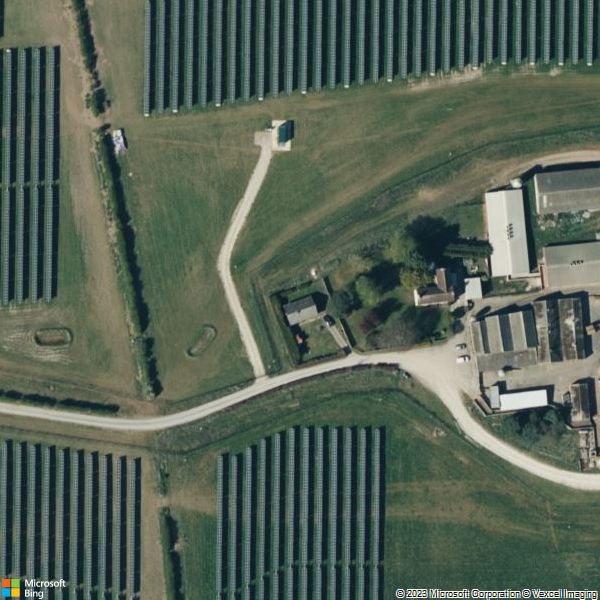

In [77]:

test = results2_df['Image Data'].iloc[[741]].values[0]
execute_dataaug_model(test)

test